<a href="https://colab.research.google.com/github/merzechan/Predicting-Diseases-in-Chinese-Cabbage/blob/main/prelim_work.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Predicting Diseases in Chinese Cabbage#
##Problem Statement##
With an increase in sustainable growth, Singapore has started to expand on urban farms and community gardens. By providing ML solutions to hobbyist and volunteers with little to no experience, this project aims to assist them to identify common diseases in chinese cabbage.

##Methodology##
For this project, we will utilize an image dataset from <a href = 'https://www.kaggle.com/giane901/chinese-cabbage-disease-detection'>Kaggle</a>. The images were pre-labelled with 3 different types of diseases: Backmoth, Leafminer and Mildew.

Typically, Backmoth or Diamond-back Month caterpillars eat the leaves aggressively, leaving large, distinct holes on the leaves. Leafminer or Leafminer Maggots tend to bore into the leaves while eating, leaving a distinct trail of squiggly yellow lines on the leaves. Mildew is a type of fungi that grows on the leaves, resulting in malnutrition on the leaves, leaving yellowing blotches or even withering.

With that information in mind, we will develop a neural network model to assist in diagnosing these blights in Chinese cabbage.

###Import Libraries and Default Values
Here we find the list of libraries and default values that we will use. Installation maybe required.

In [2]:
import pandas as pd
import numpy as np
import os, datetime
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import re
import itertools
from collections import Counter
#!pip install split-folders
#import splitfolders

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report

from skimage.segmentation import mark_boundaries

import tensorflow as tf
import tensorflow_hub as hub
import tensorboard as tb
import tensorflow_datasets as tfds
from tensorflow.keras import layers, utils
from tensorflow.keras import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import cv2

!pip install lime
from lime import lime_image

RANDOM_STATE = np.random.RandomState(0)

from google.colab import drive
drive.mount("/content/gdrive")

     |████████████████████████████████| 275 kB 4.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=209aaf21265673b9149de1d55736cfde704c19639bc8b4a279ab71880d1d477d
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
Mounted at /content/gdrive


In [3]:
TRAIN_DIR = '/content/gdrive/My Drive/bok_choy/train/'
TEST_DIR = '/content/gdrive/My Drive/bok_choy/test/'

TRAIN_PATH="/content/gdrive/MyDrive/bok_choy/split/train"
VAL_PATH="/content/gdrive/MyDrive/bok_choy/split/val"

In [4]:
# Train/Validation split by folder

#run this code only once
#splitfolders.ratio(TRAIN_DIR, output="/content/gdrive/My Drive/bok_choy/split", seed=RANDOM_STATE, ratio=(0.8, 0.2)) 

In [5]:
# Define image size
IMG_SIZE = 224

# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(preprocessing.image_dataset_from_directory(TRAIN_PATH,
                                                   image_size=(IMG_SIZE,IMG_SIZE)).class_names)

# Setup model URL from TensorFlow Hub
MobileNetV2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
EfficientNetB0 = "https://tfhub.dev/tensorflow/efficientnet/b0/classification/1"
MobileNetV3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/classification/5"
InceptionV3 = "https://tfhub.dev/google/imagenet/inception_v3/classification/5"
EfficientNetB5 = 'https://tfhub.dev/tensorflow/efficientnet/b5/classification/1' #img_size=456
EfficientNetB6 = 'https://tfhub.dev/tensorflow/efficientnet/b6/classification/1' #img_size=528

# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_auc",
                                                  patience=4)

# Tensorboard Logs path
LOGS = "/content/gdrive/My Drive/bok_choy/logs"

# Setup TensorBoard
file_writer = tf.summary.create_file_writer(LOGS)


Found 2301 files belonging to 3 classes.


In [29]:
NUM_EPOCHS = 50 #@param {type:"slider", min:10, max:100, step:10}

In [28]:
# Set number of images to use for experimenting
NUM_IMAGES = 3000 #@param {type:"slider", min:500, max:5000, step:500}

##Functions##

In [29]:
# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image



# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label





# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

# Create a function for viewing images in a data batch
def show_15_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  fig, ax = plt.subplots(3,5,figsize=(20,10))
  ax = ax.ravel()
  # Loop through 25 (for displaying 25 images)
  for i in range(15):
    # Display an image 
    ax[i].imshow(images[i].astype(np.uint8))
    # Add the image label as the title
    ax[i].title.set_text(unique_disease[labels[i].argmax()])
    # Turn the grid lines off
    ax[i].axis("off");
  fig.tight_layout()



# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MobileNetV3,image_size=IMG_SIZE):
  print("Building model with:", max(model_url.split('/')[4:]))

   # Setup the model layers
  model = Sequential([
    layers.Resizing(image_size,image_size),
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    layers.Dense(units=output_shape,
                 activation="softmax",
                 name = "output_layer") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["AUC"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

# Create a function to build a TensorBoard callback
def create_tensorboard_callback(model_name):
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join(LOGS,
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+model_name)
  return tf.keras.callbacks.TensorBoard(logdir)


# Build a function to train and return a trained model
def train_model(model,model_name):
  
  # Trains a given model and returns the trained version.

  # Create training image generator
  train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    vertical_flip=True
    )

  train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH ,
    target_size=(IMG_SIZE,IMG_SIZE),
    batch_size= BATCH_SIZE,
    class_mode="categorical"
    )
  
  # Create validation image generator
  val_datagen = ImageDataGenerator(
    rescale=1./255,
    )

  val_generator = val_datagen.flow_from_directory(
    VAL_PATH,
    target_size=(IMG_SIZE,IMG_SIZE),
    batch_size= BATCH_SIZE,
    class_mode="categorical"
    )


  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback(model_name)

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_generator,
            steps_per_epoch= len(preprocessing.image_dataset_from_directory(TRAIN_PATH)),
            epochs=NUM_EPOCHS,
            validation_data=val_generator,
            validation_steps= len(preprocessing.image_dataset_from_directory(VAL_PATH)),
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model



def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_disease[np.argmax(prediction_probabilities)]


def unbatchify(data,str_labels=True):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  if str_labels:
    for image, label in data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(unique_disease[np.argmax(label)])
  else:
    for image, label in data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(label)
  return images, labels


def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image.astype(np.uint8))
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_disease[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/gdrive/My Drive/bok_choy/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

  

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  sns.set_style('white')
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap='GnBu') # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

  class_report = classification_report(y_true, y_pred)
  print(class_report)

# Batch Predict
def batch_predict(model,validation=val_data, num_rows=5, num_cols=2,i_multiplier=20):
  # Make predictions on the validation data (not used to train on)
  predictions = model.predict(validation, verbose=0)
  val_images, val_labels = unbatchify(validation)
  
  # Subplot predictions
  num_images = num_rows*num_cols
  plt.figure(figsize=(10*num_cols, 5*num_rows))
  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                  labels=val_labels,
                  n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()


# LIME Explainer
def LIME_explanation(model,img,n_samples=1000):
  explainer = lime_image.LimeImageExplainer()
  explanation = explainer.explain_instance(img.numpy().astype('double'), model.predict,  
                                         top_labels=3, hide_color=0, num_samples=n_samples)

  temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
  temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
  ax1.imshow(mark_boundaries(temp_1, mask_1))
  ax2.imshow(mark_boundaries(temp_2, mask_2))
  ax1.axis('off')
  ax2.axis('off')

##EDA ##
Looking at the index as well as the images that we preprocess with Keras, we can see if their numbers add up

In [40]:
train_set = ImageDataGenerator().flow_from_directory(TRAIN_DIR,class_mode='categorical',classes=['backmoth','mildew','leafminer'])
len(train_set)

Found 2878 images belonging to 3 classes.


90

In [ ]:
img[0]

In [7]:
df = pd.read_csv("/content/gdrive/My Drive/bok_choy/train.csv")
print(df.describe())
print(df.head())

       has_backmoth  has_leafminer   has_mildew
count   2878.000000    2878.000000  2878.000000
mean       0.623002       0.115705     0.261293
std        0.484719       0.319927     0.439415
min        0.000000       0.000000     0.000000
25%        0.000000       0.000000     0.000000
50%        1.000000       0.000000     0.000000
75%        1.000000       0.000000     1.000000
max        1.000000       1.000000     1.000000
          id  has_backmoth  has_leafminer  has_mildew
0  Backmoth1             1              0           0
1  Backmoth2             1              0           0
2  Backmoth3             1              0           0
3  Backmoth4             1              0           0
4  Backmoth5             1              0           0


['backmoth', 'mildew', 'leafminer']
[1793, 752, 333]


<BarContainer object of 3 artists>

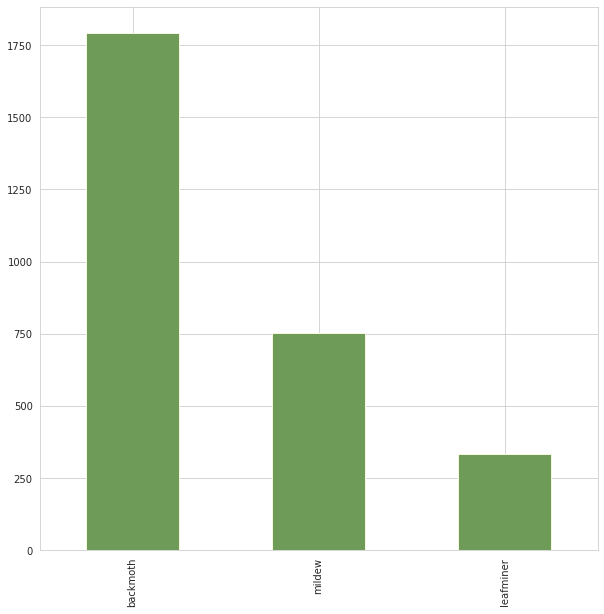

In [41]:
# Create function to undummify categorical labels
def undummify(df, prefix_sep="_"):
    cols2collapse = {
        item.split(prefix_sep)[0]: (prefix_sep in item) for item in df.columns
    }
    series_list = []
    for col, needs_to_collapse in cols2collapse.items():
        if needs_to_collapse:
            undummified = (
                df.filter(like=col)
                .idxmax(axis=1)
                .apply(lambda x: x.split(prefix_sep, maxsplit=1)[1])
                .rename(col)
            )
            series_list.append(undummified)
        else:
            series_list.append(df[col])
    undummified_df = pd.concat(series_list, axis=1)
    return undummified_df

sns.set_style('whitegrid')
undummify(df)['has'].value_counts().plot.bar(figsize=(10, 10))

counter = Counter(train_set.classes)
x=[]
y=[]
for i in train_set.class_indices.keys():
  x.append(i)
for i,j in counter.items():
  y.append(j)
print(x)
print(y)
plt.bar(x,y,alpha=0.5,color='y',width=0.5)

Here we observe that the number of images and their corresponding classes matches. Therefore, we proceed to map out their paths and labels.

In [15]:
filenames=[]
labels=[]
for root, dirs, files in os.walk(TRAIN_PATH, topdown=True):
  for name in files:
      filenames.append(os.path.join(root, name))
      labels.append(name)

In [16]:
labels[:10]

['Backmoth1594.jpg',
 'Backmoth158.jpg',
 'Backmoth1584.jpg',
 'Backmoth15.jpg',
 'Backmoth1485.jpg',
 'Backmoth1589.jpg',
 'Backmoth1541.jpg',
 'Backmoth1477.jpg',
 'Backmoth1484.jpg',
 'Backmoth1524.jpg']

In [17]:
labels = [re.split(r'(\d+)', s)[0].lower() for s in labels]
labels[:10]

['backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth']

In [21]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


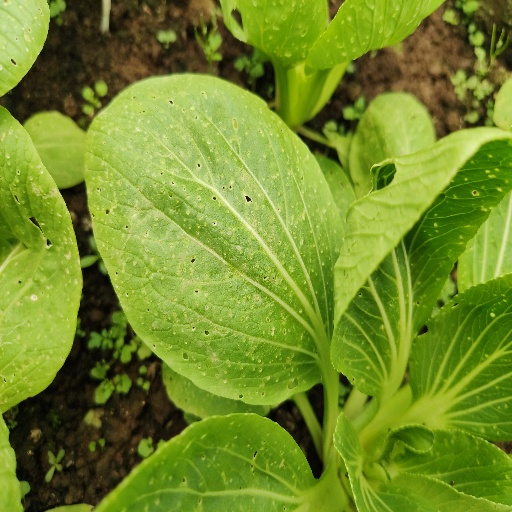

/content/gdrive/MyDrive/bok_choy/split/train/backmoth/Backmoth1645.jpg


In [20]:
display(Image(filenames[123]))
print(filenames[123])

###Train Test Split###
From an earlier visual inspection of the image data, we noticed that there are images that are very similar in nature, only slightly shifted by a few pixels. In order to avoid data leakage from this distribution, we manually create our training and validation sets by segregating them in separate directory paths. From here we will generate our training and validation batches into Tensorflow Datasets.

In [18]:
train_data = tf.keras.utils.image_dataset_from_directory(TRAIN_PATH,
                                                   image_size=(IMG_SIZE,IMG_SIZE),
                                                   seed=123
                                                   )
val_data = tf.keras.utils.image_dataset_from_directory(VAL_PATH,
                                                   image_size=(IMG_SIZE,IMG_SIZE),
                                                   seed=123
                                                   )
train_data.class_names

Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.


['backmoth', 'leafminer', 'mildew']

In [19]:
# Checking for 1D labels
for image_batch, label_batch in train_data.take(1):
  print(label_batch.numpy())

[2 2 0 2 0 2 2 2 0 1 2 0 0 0 0 0 2 0 0 1 0 2 0 2 2 0 0 1 0 0 1 0]


In [23]:
# Find the unique label values
unique_disease = np.array(train_data.class_names)
print("no. of unique diseases:",len(unique_disease))
print(unique_disease)
type(unique_disease)

no. of unique diseases: 3
['backmoth' 'leafminer' 'mildew']


numpy.ndarray

In [24]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_disease

backmoth


array([ True, False, False])

In [25]:
# Turn every label into a boolean array
boolean_labels = [label == unique_disease for label in labels]
boolean_labels[:10]

[array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False])]

In [26]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_disease == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

backmoth
(array([0]),)
0
[1 0 0]


In [25]:
# Convert image to NumPy array
image = plt.imread(filenames[42])
image.shape

(512, 512, 3)

In [26]:
image.max(), image.min()

(255, 0)

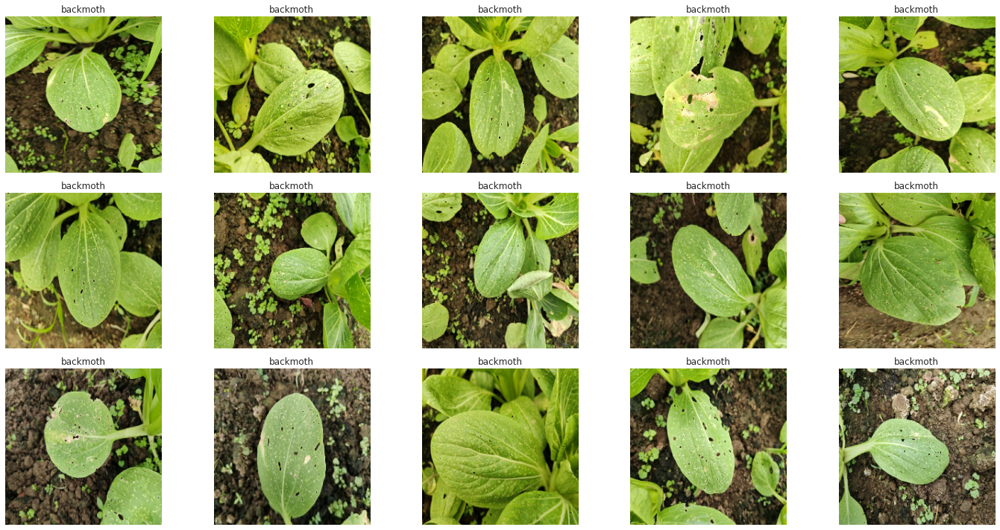

In [28]:
# Visualizing the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_15_images(train_images, train_labels)

##Training Models##
With the functions we defined earlier, we can now instantiate and fit multiple models to see which ones perform the best, and then proceed to refine from there.

In [33]:
# Fit MobileNetV2 model
model_mobilenetv2 = train_model(create_model(model_url=MobileNetV2),"MobileNetV2_rebase")

Building model with: mobilenet_v2_130_224
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 61s 698ms/step - loss: 0.9693 - auc: 0.7696 - val_loss: 0.8464 - val_auc: 0.7965
Epoch 2/50
72/72 [==============================] - 51s 702ms/step - loss: 0.7623 - auc: 0.8385 - val_loss: 0.8098 - val_auc: 0.8308
Epoch 3/50
72/72 [==============================] - 49s 680ms/step - loss: 0.6720 - auc: 0.8764 - val_loss: 0.7081 - val_auc: 0.8616
Epoch 4/50
72/72 [==============================] - 48s 670ms/step - loss: 0.6347 - auc: 0.8891 - val_loss: 0.7115 - val_auc: 0.8678
Epoch 5/50
72/72 [==============================] - 48s 674ms/step - loss: 0.5893 - auc: 0.9047 - val_loss: 0.7454 - val_auc: 0.8674
Epoch 6/50
72/72 [==============================] - 48s 668ms/step - loss: 0.5864 - auc: 0.9063 - val_loss: 0.6961 - val_auc: 0.8

In [34]:
# Fit EfficientNetB0 model
model_efficientnetB0 = train_model(create_model(model_url=EfficientNetB0),"EfficientNetB0_rebase")

Building model with: efficientnet
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 63s 693ms/step - loss: 1.0731 - auc: 0.7058 - val_loss: 1.0398 - val_auc: 0.7509
Epoch 2/50
72/72 [==============================] - 49s 680ms/step - loss: 1.0155 - auc: 0.7511 - val_loss: 0.9920 - val_auc: 0.7585
Epoch 3/50
72/72 [==============================] - 49s 680ms/step - loss: 0.9744 - auc: 0.7631 - val_loss: 0.9584 - val_auc: 0.7604
Epoch 4/50
72/72 [==============================] - 49s 677ms/step - loss: 0.9460 - auc: 0.7625 - val_loss: 0.9356 - val_auc: 0.7661
Epoch 5/50
72/72 [==============================] - 49s 676ms/step - loss: 0.9274 - auc: 0.7658 - val_loss: 0.9206 - val_auc: 0.7707
Epoch 6/50
72/72 [==============================] - 49s 677ms/step - loss: 0.9148 - auc: 0.7696 - val_loss: 0.9105 - val_auc: 0.7733
Epoc

In [35]:
# Fit MobileNetV3 model
model_mobilenetv3 = train_model(create_model(model_url=MobileNetV3),"MobileNetV3_rebase")

Building model with: mobilenet_v3_small_100_224
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 54s 670ms/step - loss: 0.9186 - auc: 0.7850 - val_loss: 0.7810 - val_auc: 0.8322
Epoch 2/50
72/72 [==============================] - 47s 656ms/step - loss: 0.6891 - auc: 0.8664 - val_loss: 0.7157 - val_auc: 0.8575
Epoch 3/50
72/72 [==============================] - 47s 652ms/step - loss: 0.6077 - auc: 0.8968 - val_loss: 0.7247 - val_auc: 0.8657
Epoch 4/50
72/72 [==============================] - 47s 657ms/step - loss: 0.5542 - auc: 0.9152 - val_loss: 0.6678 - val_auc: 0.8809
Epoch 5/50
72/72 [==============================] - 47s 657ms/step - loss: 0.5265 - auc: 0.9228 - val_loss: 0.6524 - val_auc: 0.8857
Epoch 6/50
72/72 [==============================] - 47s 656ms/step - loss: 0.5093 - auc: 0.9284 - val_loss: 0.6422 - val_au

In [36]:
# Fit InceptionV3 model
model_inceptionv3 = train_model(create_model(model_url=InceptionV3),"InceptionV3_rebase")

Building model with: inception_v3
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 58s 690ms/step - loss: 1.1059 - auc: 0.7486 - val_loss: 0.8389 - val_auc: 0.8173
Epoch 2/50
72/72 [==============================] - 49s 676ms/step - loss: 0.7864 - auc: 0.8367 - val_loss: 0.7661 - val_auc: 0.8344
Epoch 3/50
72/72 [==============================] - 48s 672ms/step - loss: 0.7429 - auc: 0.8524 - val_loss: 0.7087 - val_auc: 0.8624
Epoch 4/50
72/72 [==============================] - 49s 674ms/step - loss: 0.6773 - auc: 0.8752 - val_loss: 0.7587 - val_auc: 0.8330
Epoch 5/50
72/72 [==============================] - 48s 668ms/step - loss: 0.6432 - auc: 0.8862 - val_loss: 0.6839 - val_auc: 0.8705
Epoch 6/50
72/72 [==============================] - 49s 677ms/step - loss: 0.6320 - auc: 0.8902 - val_loss: 0.7090 - val_auc: 0.8708
Epoc

In [37]:
# Fit EfficientNetB5 Model
model_efficientnetb5 = train_model(create_model(model_url=EfficientNetB5,image_size=456),"EfficientNetb5_rebase")

Building model with: efficientnet
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 94s 896ms/step - loss: 1.0728 - auc: 0.7023 - val_loss: 1.0393 - val_auc: 0.7653
Epoch 2/50
72/72 [==============================] - 63s 872ms/step - loss: 1.0149 - auc: 0.7415 - val_loss: 0.9911 - val_auc: 0.7698
Epoch 3/50
72/72 [==============================] - 63s 873ms/step - loss: 0.9740 - auc: 0.7588 - val_loss: 0.9580 - val_auc: 0.7759
Epoch 4/50
72/72 [==============================] - 63s 868ms/step - loss: 0.9461 - auc: 0.7597 - val_loss: 0.9351 - val_auc: 0.7770
Epoch 5/50
72/72 [==============================] - 62s 853ms/step - loss: 0.9273 - auc: 0.7670 - val_loss: 0.9199 - val_auc: 0.7807
Epoch 6/50
72/72 [==============================] - 61s 840ms/step - loss: 0.9143 - auc: 0.7699 - val_loss: 0.9096 - val_auc: 0.7832
Epoc

In [38]:
# Fit EfficientNetB6 Model
model_efficientnetb6 = train_model(create_model(model_url=EfficientNetB6,image_size=528),"EfficientNetb6_rebase")

Building model with: efficientnet
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 121s 1s/step - loss: 1.0607 - auc: 0.7399 - val_loss: 1.0304 - val_auc: 0.7683
Epoch 2/50
72/72 [==============================] - 80s 1s/step - loss: 1.0047 - auc: 0.7548 - val_loss: 0.9839 - val_auc: 0.7751
Epoch 3/50
72/72 [==============================] - 78s 1s/step - loss: 0.9655 - auc: 0.7593 - val_loss: 0.9528 - val_auc: 0.7795
Epoch 4/50
72/72 [==============================] - 78s 1s/step - loss: 0.9394 - auc: 0.7640 - val_loss: 0.9319 - val_auc: 0.7755
Epoch 5/50
72/72 [==============================] - 79s 1s/step - loss: 0.9224 - auc: 0.7619 - val_loss: 0.9179 - val_auc: 0.7763
Epoch 6/50
72/72 [==============================] - 78s 1s/step - loss: 0.9114 - auc: 0.7675 - val_loss: 0.9094 - val_auc: 0.7787
Epoch 7/50
72/72 [===

### Evaluating Models' Performances in Tensorboard
By using Tensorboard we can easily observe the results of our model fits. Here we observe that all of the EfficientNet models perform much worse than the rest when measured for AUC.

This warrants an extra investigation as the larger EfficientNet models tends to have larger input sizes, which tells us that more data gets fitted into the model. This should intuitively lead to higher scores, which was not the case in our findings below.

In [39]:
# Load TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/My\ Drive/bok_choy/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2269), started 2:29:40 ago. (Use '!kill 2269' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Load in the full model
model_imagegen_efficientnetb5 = load_model('/content/gdrive/My Drive/bok_choy/models/20211207-12281638880132-EfficientNetB5_imagegen.h5')

Loading saved model from: /content/gdrive/My Drive/bok_choy/models/20211207-12281638880132-EfficientNetB5_imagegen.h5


## Comparing MobileNetV2 against EfficientNetB6

Despite using AUC metric to gauge the early stopping, below we see a batch example of predictions. MobileNetV2 predicts more wrong labels compared to EfficientNetB6. This is further supplimented by the confusion matrices that reveals another interesting observation.



### Batch Predictions###
Using a function we defined, we plot the images against their corresponding model predictions and confidence.

MobileNetV2 has made more wrong predictions compared to EfficientNetB6.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model_efficientnetb6.predict(val_data, verbose=1)

19/19 [==============================] - 118s 6s/step


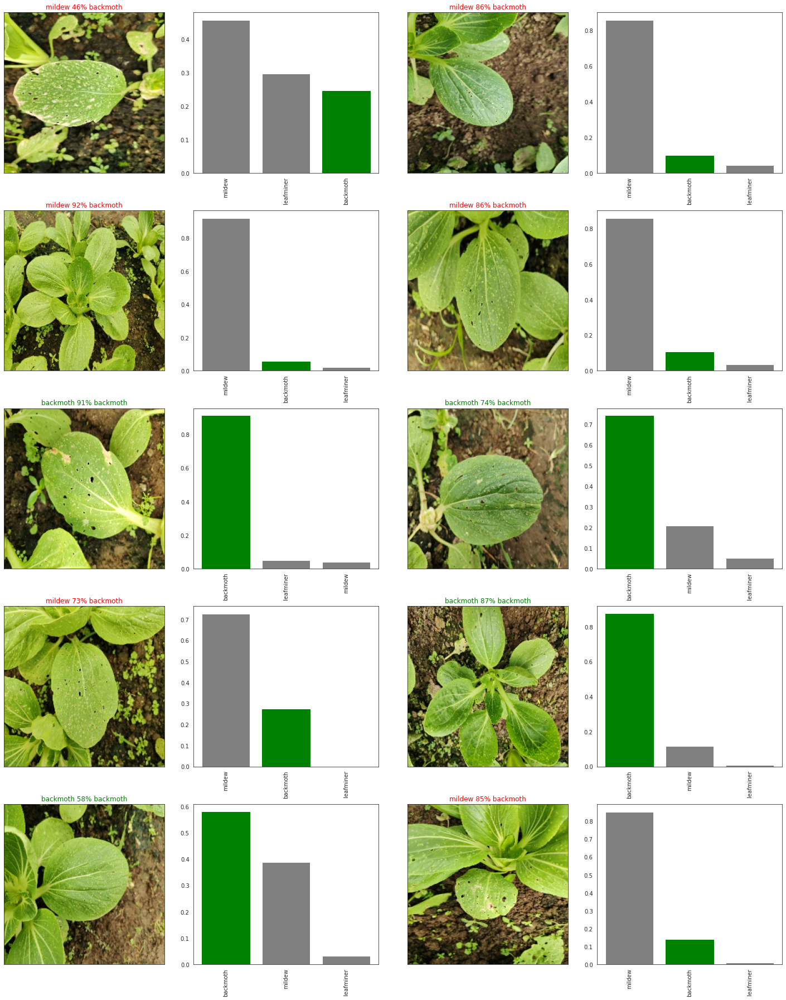

In [60]:
batch_predict(model_mobilenetv2)

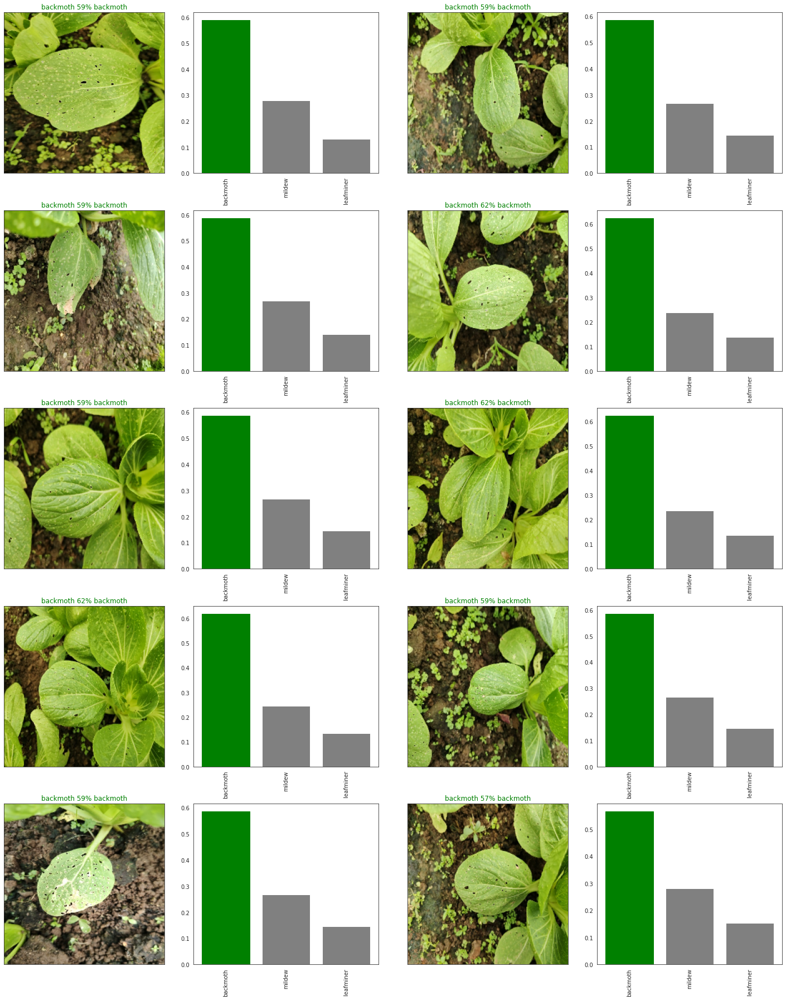

In [61]:
batch_predict(model_efficientnetb6)

### Confusion Matrices###
Using confusion matrices, we can further compare the performances of the models.

Here we see that MobileNetV2 has a significantly lower accuracy, but has better macro f1 score since it's willing to predict the minority classes.

In contrast, EfficientNetB6 only has better accuracy since it is only willing to predict the majority class 100% of the time.

In [42]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data,str_labels=False)

In [43]:
val_labels[:10]

[0, 1, 0, 0, 0, 2, 0, 2, 2, 0]

In [44]:
# Make predictions on the validation data (not used to train on)
predictions_mv2 = model_mobilenetv2.predict(val_data, verbose=1)

19/19 [==============================] - 3s 82ms/step


In [46]:
pred_labels_mv2 = predictions_mv2.argmax(axis=1)
pred_labels_mv2[:10]

array([0, 1, 2, 0, 2, 0, 2, 0, 2, 2])

              precision    recall  f1-score   support

           0       0.59      0.22      0.32       359
           1       0.30      0.04      0.08        67
           2       0.25      0.71      0.37       151

    accuracy                           0.33       577
   macro avg       0.38      0.32      0.25       577
weighted avg       0.46      0.33      0.30       577



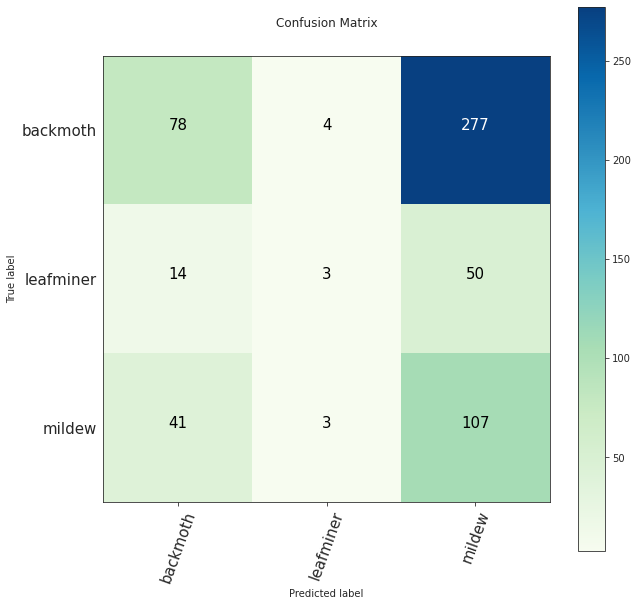

In [69]:
make_confusion_matrix(val_labels, pred_labels_mv2, classes=val_data.class_names, figsize=(10, 10), text_size=15, norm=False, savefig=False)

In [63]:
# Make predictions on the validation data (not used to train on)
predictions_b6 = model_efficientnetb6.predict(val_data, verbose=1)

19/19 [==============================] - 17s 859ms/step


In [64]:
predictions_b6[:10]

array([[0.627912  , 0.13643667, 0.23565133],
       [0.5860581 , 0.1469262 , 0.26701578],
       [0.6239566 , 0.13803217, 0.23801127],
       [0.5860581 , 0.1469262 , 0.26701578],
       [0.6012878 , 0.16035324, 0.23835899],
       [0.5961534 , 0.1429702 , 0.2608764 ],
       [0.6170089 , 0.13450333, 0.24848774],
       [0.6094255 , 0.1562479 , 0.23432657],
       [0.5860581 , 0.1469262 , 0.26701578],
       [0.6239566 , 0.13803217, 0.23801127]], dtype=float32)

In [65]:
pred_labels_b6 = predictions_b6.argmax(axis=1)
pred_labels_b6[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [66]:
val_data.class_names

['backmoth', 'leafminer', 'mildew']

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.62      1.00      0.77       359
           1       0.00      0.00      0.00        67
           2       0.00      0.00      0.00       151

    accuracy                           0.62       577
   macro avg       0.21      0.33      0.26       577
weighted avg       0.39      0.62      0.48       577



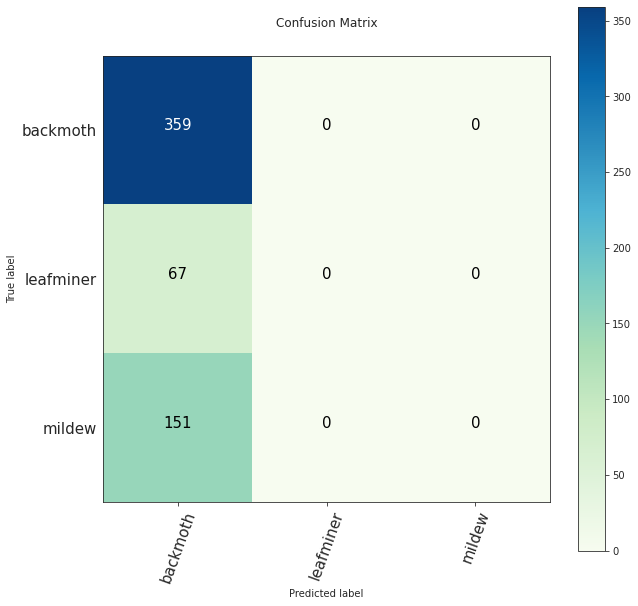

In [70]:
make_confusion_matrix(val_labels, pred_labels_b6, classes=val_data.class_names, figsize=(10, 10), text_size=15, norm=False, savefig=False)

### LIME Explainer###
With LIME Explainer, we observe the clusters of superpixels that the models consider as the most important features, as well as negative features.

Due to the input size, we can see that MobileNetV2 creates larger clusters due to their smaller input size. In contrast, EfficientNetB6 creates smaller clusters.

Also note that both models pick up noise (in this case soil images) among the important features.

In [30]:
filenames[0]

'/content/gdrive/MyDrive/bok_choy/split/train/backmoth/Backmoth1594.jpg'

In [40]:
sample_img, sample_label = get_image_label(filenames[0], labels[0])

  0%|          | 0/1000 [00:00<?, ?it/s]

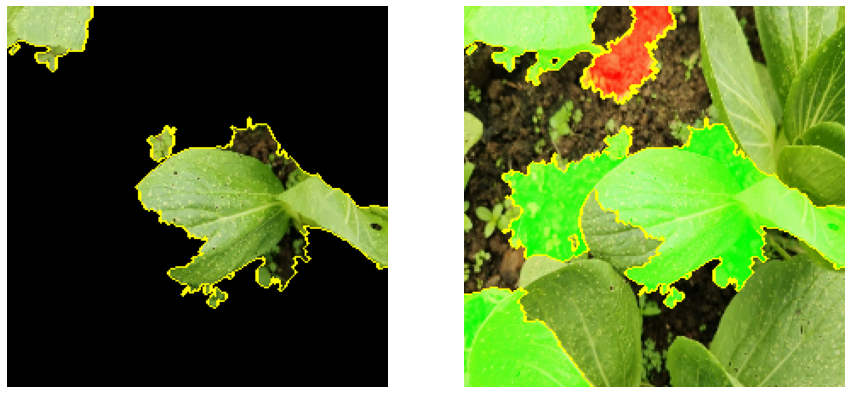

In [41]:
LIME_explanation(model_mobilenetv2,sample_img)

  0%|          | 0/1000 [00:00<?, ?it/s]

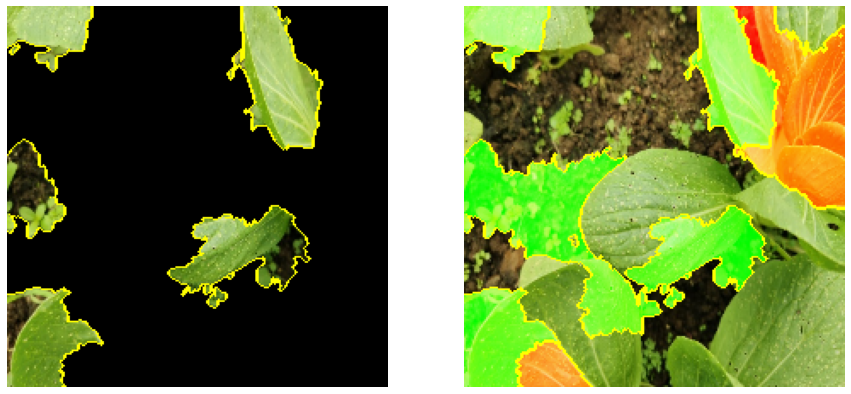

In [62]:
LIME_explanation(model_efficientnetb6,sample_img)

##Next Steps##
Preliminary findings from this exercise has shown that early stopping on AUC was not a good choice of metrics. Going forward in the next notebook, we will perform several changes. This includes oversampling, and using f1 score as the main metrics.